### This notebook uses SMOTE to oversample parts of the feature space. 
GESIS is smoted to recreate the MRS problem. There seems to be a bug somewhere.

In [18]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE

from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score

from sklearn import metrics
import matplotlib.pyplot as plt

gesis = pd.read_csv('gesis_processed.csv', encoding = "ISO-8859-1", delimiter = ',')

gesis = gesis.fillna(gesis.median())
gesis['__Geschlecht'] = gesis['Geschlecht']

drop = ['Personen im Haushalt',
       'Nettoeinkommen Selbst', 'Nettoeinkommen Haushalt', 'Schlechter Schlaf',
       'Leben genießen', 'Zu Nichts aufraffen', 'Alles anstrengend',
       'Wahlteilnahme', 'Wahlabsicht', 'Desinteresse Politiker',
       'Zufriedenheit Leben', 'Aktiv', 'Verärgert', 'Wach', 'Nervös', 
       'Ängstlich',
       'Geburtsjahr', 'Geburtsland', 'Nationalitaet',
       'Familienstand', 'Hoechster Bildungsabschluss', 'Berufliche Ausbildung',
       'Erwerbstaetigkeit', 'Berufsgruppe', 'GESIS-CODE', 'Geschlecht']

gesis = gesis.drop(columns=drop, axis=1)

In [19]:
def roc(y_test, preds, name):
    #alp = min(iteration+0.2,0.8)
    alp = 1
    fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
    roc_auc = metrics.auc(fpr, tpr)
    plt.title('Iteration: '+ str(name))
    plt.plot(fpr, tpr, 'black', label = 'AUC = %0.2f' % roc_auc,alpha=alp)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'k--', alpha=alp)
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.savefig('roc/roc_'+str(name)+".png")
    plt.show()

In [20]:
rep = gesis.head(2000).copy()
tmp = gesis.tail(2000).copy()

nonrep = pd.concat([tmp[tmp.__Geschlecht == 1].head(500), 
                    tmp[tmp.__Geschlecht == 0]]).copy()

y = nonrep.__Geschlecht
X = nonrep.drop(columns = ['__Geschlecht'], axis=1)

smote = SMOTE(ratio='minority')
#smote = ADASYN(ratio='minority')

X_sm, y_sm = smote.fit_sample(X, y)

nonrep = pd.DataFrame(X_sm)
nonrep.columns = rep.columns[:-1]

nonrep['__Geschlecht'] = y_sm

nonrep = pd.concat([nonrep, tmp[tmp.__Geschlecht ==1].tail(400)])
print(nonrep['__Geschlecht'].value_counts())
print(rep['__Geschlecht'].value_counts())

rep['Umfrage'] = 1
nonrep['Umfrage'] = 0


1    1362
0     962
Name: __Geschlecht, dtype: int64
1    1046
0     954
Name: __Geschlecht, dtype: int64


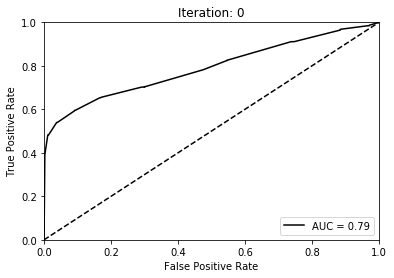

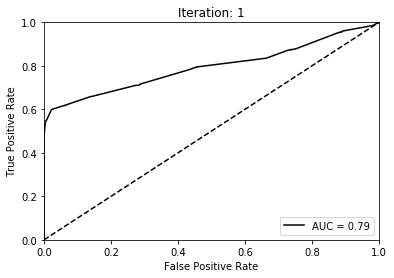

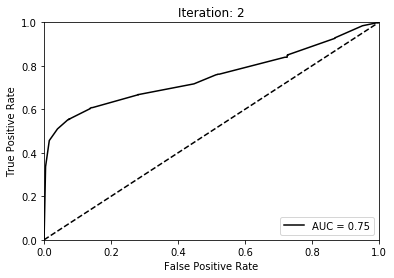

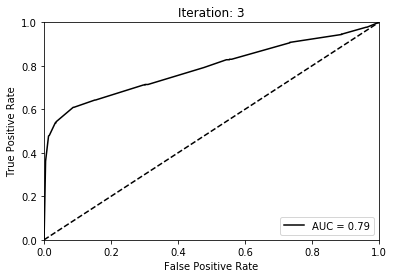

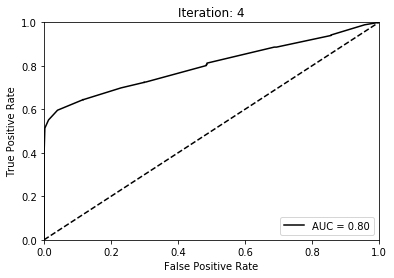

...

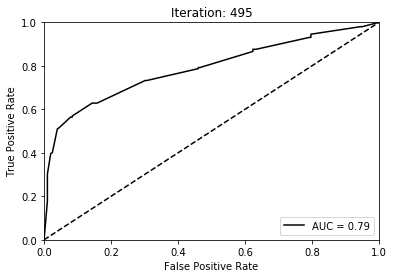

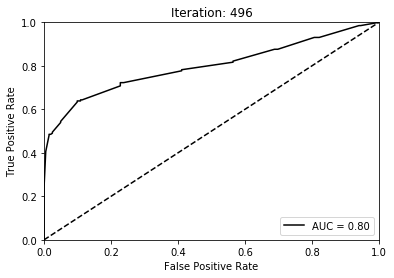

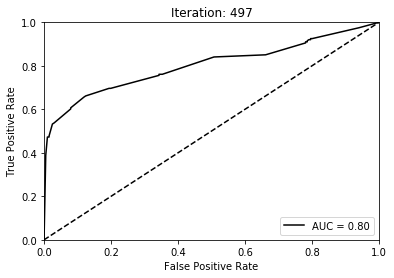

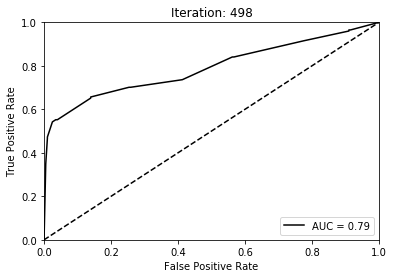

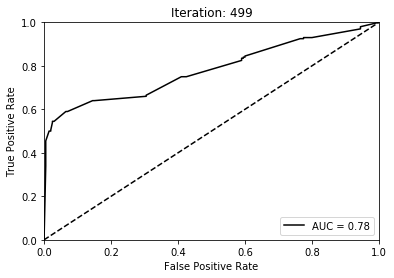

In [21]:

nonrep_base = nonrep.copy()

n = 900
iterations = 500

for ite in range(iterations):
    #for loop
    fst = int(n/2) #first half
    lst = n - fst  #second half

    df_1 = nonrep.head(fst).copy()
    df_2 = nonrep.tail(lst).copy()

    train = pd.concat([rep.sample(n=lst,replace=False), df_2])
    test = pd.concat([rep.sample(n=fst,replace=False), df_1])

    y = train.Umfrage
    X = train.drop(columns = ['Umfrage'], axis=1)
    clf = RandomForestClassifier(max_depth=100)
    clf.fit(X, y)

    y_test = test.Umfrage
    X_test = test.drop(columns = ['Umfrage'], axis=1)

    preds = [i[1] for i in clf.predict_proba(X_test)]
    roc(y_test, preds, ite) 
    
    rem = df_1.drop(columns = ['Umfrage'], axis=1)
    result = [i[1] for i in clf.predict_proba(rem)]

    nonrep = nonrep.drop(nonrep.index[np.argmax(result)]).copy()
    n = n-1

In [24]:
nonrep['__Geschlecht'].value_counts()

1    1061
0     763
Name: __Geschlecht, dtype: int64

In [25]:
nonrep_base['__Geschlecht'].value_counts()

1    1362
0     962
Name: __Geschlecht, dtype: int64